In [1]:
%pip install requests==2.32.3 -q
%pip install pandas==2.2.2 -q
%pip install numpy==2.0.2 -q
%pip install pm4py==2.7.11.13 -q
%pip install scikit-learn==1.5.2 -q

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:

import os
import io
import zipfile

import requests
import pm4py
import pandas as pd
import numpy as np

from sklearn.cluster import KMeans


In [3]:

def download_zip(url: str, to) -> str:

    response = requests.get(url)

    if response.status_code != 200:
        raise ConnectionError(f'There was an [{response.status_code}] error with the connection')

    if not os.path.isdir(to):
        os.mkdir(to)

    zip = zipfile.ZipFile(io.BytesIO(response.content))
    zip.extractall(to)

    return to

url_zip = 'https://data.4tu.nl/file/67d71073-7ece-4455-9840-9d48ee480160/68a909ed-ea0c-4e30-841a-4bce336e8e8c'
destination_folder = 'clusteringData'

download_zip(url=url_zip, to=destination_folder)


'clusteringData'

In [4]:

df = pd.read_csv(os.path.join('clusteringData', 'Production_Data.csv'))
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4543 entries, 0 to 4542
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Case ID             4543 non-null   object
 1   Activity            4543 non-null   object
 2   Resource            4543 non-null   object
 3   Start Timestamp     4543 non-null   object
 4   Complete Timestamp  4543 non-null   object
 5   Span                4543 non-null   object
 6   Work Order  Qty     4543 non-null   int64 
 7   Part Desc.          4543 non-null   object
 8   Worker ID           4543 non-null   object
 9   Report Type         4543 non-null   object
 10  Qty Completed       4543 non-null   int64 
 11  Qty Rejected        4543 non-null   int64 
 12  Qty for MRB         4543 non-null   int64 
 13  Rework              32 non-null     object
dtypes: int64(4), object(10)
memory usage: 497.0+ KB


In [5]:
df.head()

,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Span,Work Order Qty,Part Desc.,Worker ID,Report Type,Qty Completed,Qty Rejected,Qty for MRB,Rework
0,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/29 23:24:00.000,2012/01/30 05:43:00.000,006:19,10,Cable Head,ID4932,S,1,0,0,NaN
1,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 05:44:00.000,2012/01/30 06:42:00.000,000:58,10,Cable Head,ID4932,D,1,0,0,NaN
2,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 06:59:00.000,2012/01/30 07:21:00.000,000:22,10,Cable Head,ID4167,S,0,0,0,NaN
3,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 07:21:00.000,2012/01/30 10:58:00.000,003:37,10,Cable Head,ID4167,D,8,0,0,NaN
4,Case 1,Turning & Milling Q.C.,Quality Check 1,2012/01/31 13:20:00.000,2012/01/31 14:50:00.000,001:30,10,Cable Head,ID4163,D,9,1,0,NaN


In [6]:

df['Activity'].unique()


array(['Turning & Milling - Machine 4', 'Turning & Milling Q.C.',
       'Laser Marking - Machine 7', 'Lapping - Machine 1',
       'Round Grinding - Machine 3', 'Final Inspection Q.C.', 'Packing',
       'Turning & Milling - Machine 9', 'Turning Q.C.',
       'Flat Grinding - Machine 11', 'Turning & Milling - Machine 8',
       'Grinding Rework - Machine 12', 'Setup - Machine 8',
       'Round Grinding - Machine 12', 'Round Grinding - Manual',
       'Round Grinding - Q.C.', 'Turning & Milling - Machine 5',
       'Turning & Milling - Machine 10', 'Round Grinding - Machine 2',
       'Turning & Milling - Machine 6', 'Turning - Machine 4',
       'Grinding Rework', 'SETUP     Turning & Milling - Machine 5',
       'Final Inspection - Weighting', 'Turning - Machine 9',
       'Deburring - Manual', 'Turning - Machine 8',
       'Wire Cut - Machine 13', 'Wire Cut - Machine 18',
       'Rework Milling - Machine 28', 'Fix EDM', 'Milling Q.C.',
       'Milling - Machine 14', 'Flat Grinding -

In [7]:
df['Resource'].unique()

array(['Machine 4 - Turning & Milling', 'Quality Check 1',
       'Machine 7- Laser Marking', 'Machine 1 - Lapping',
       'Machine 3 - Round Grinding', 'Packing',
       'Machine 9 - Turning & Milling', 'Machine 11 - Grinding',
       'Machine 8 - Turning & Milling', 'Machine 12 - Grinding',
       'Machine 27 - Grinding', 'Machine 5 - Turning & Milling',
       'Machine 10 - Grinding', 'Machine 2 - Round Grinding',
       'Machine 6 - Turning & Milling', 'Manual Deburring',
       'Wire Cut - Machine 13', 'Machine 18 - Wire Cutting',
       'Manual Milling - Machine 28', 'Machine 17 - Sinking',
       'Machine 14 - Milling', 'Machine 26 - Flat Grinding',
       'Machine 15 - Turning', 'Machine 25 - Grinding', 'Quality Check 2',
       'Oven', 'Machine 21 - Turning', 'Machine 16 - Milling',
       'Machine 22 - Milling', 'Machine 19 - Grinding',
       'Machine 23 - Turning'], dtype=object)

In [8]:
df['Worker ID'].describe()

count       4543
unique        49
top       ID4618
freq         431
Name: Worker ID, dtype: object

In [9]:
df['Part Desc.'].unique()

array(['Cable Head', 'Spur Gear', 'Ballnut', 'Housing', 'Adjusting Nut',
       'Bearing', 'Bushing', 'Electrical Contact', 'Clamp', 'Wheel Shaft',
       'Cylinder', 'Plug', 'Locker', 'Spring', 'Piston', 'Ring', 'Drill',
       'Spinner', 'Punch Holder', 'Tube', 'Seal Head', 'Socket',
       'Slip Ring Adapter', 'Punch Plate', 'Gauge', 'O-Ring',
       'Cutting Wheel', 'Flange', 'Shim', 'Flange Bolt', 'Fastener',
       'Disc', 'Barrel', 'Blade', 'Compound Dies', 'Locknut', 'Cast',
       'Wheel', 'Assembly 1', 'Spindle', 'Adapter', 'Drum', 'Hinge'],
      dtype=object)

<Axes: ylabel='Frequency'>

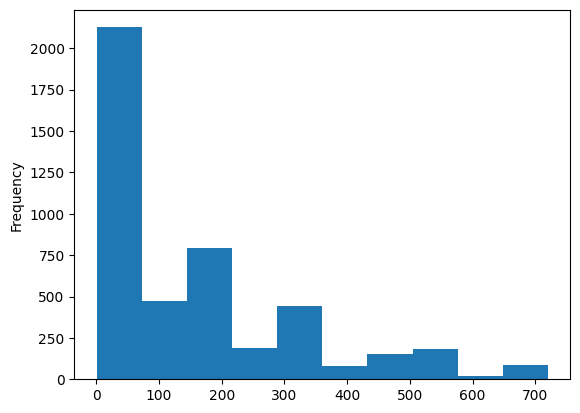

In [10]:
df['Work Order  Qty'].plot.hist()

<Axes: ylabel='Frequency'>

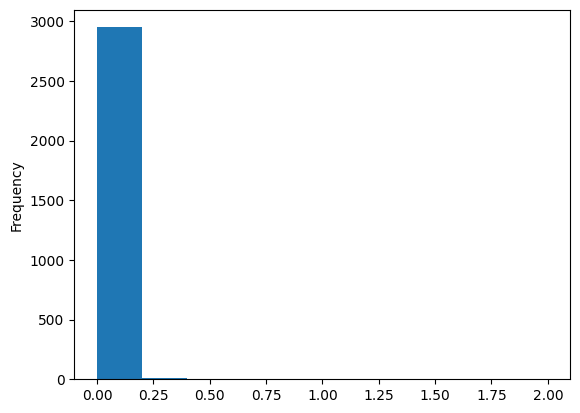

In [11]:
(df[df['Qty Completed'] > 0]['Qty Rejected'] / df[df['Qty Completed'] > 0]['Qty Completed']).plot.hist()

# Hipótese 01
### Existe uma diferença entre os menores e maiores níveis de rejeição?

In [12]:
df.info(0)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4543 entries, 0 to 4542
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Case ID             4543 non-null   object
 1   Activity            4543 non-null   object
 2   Resource            4543 non-null   object
 3   Start Timestamp     4543 non-null   object
 4   Complete Timestamp  4543 non-null   object
 5   Span                4543 non-null   object
 6   Work Order  Qty     4543 non-null   int64 
 7   Part Desc.          4543 non-null   object
 8   Worker ID           4543 non-null   object
 9   Report Type         4543 non-null   object
 10  Qty Completed       4543 non-null   int64 
 11  Qty Rejected        4543 non-null   int64 
 12  Qty for MRB         4543 non-null   int64 
 13  Rework              32 non-null     object
dtypes: int64(4), object(10)
memory usage: 497.0+ KB


In [13]:
df['Rejection'] = np.where(df['Qty Completed'] > 0, df['Qty Rejected'] / df['Qty Completed'], 0)
df['Rejection'].describe()

count    4543.000000
mean        0.003078
std         0.049781
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: Rejection, dtype: float64

In [14]:
# Separate in two data sets
df_no_rejection = df[df.Rejection == 0].copy()
df_rejection = df[df.Rejection > 0].copy()

Sem rejeições

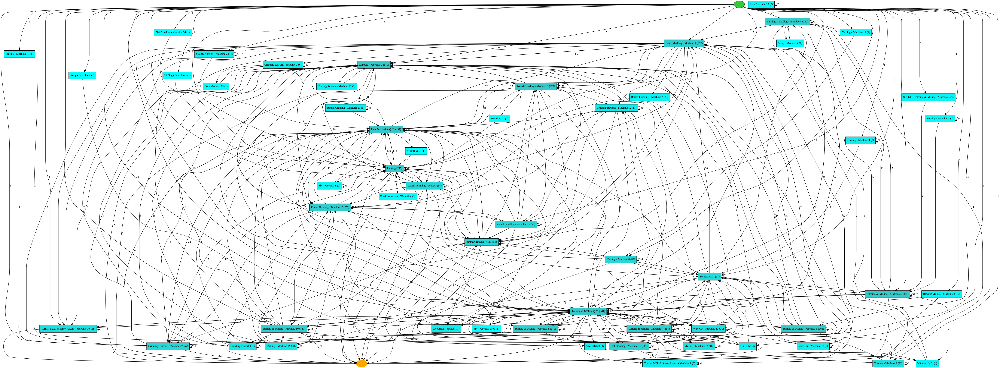

In [15]:

df_pm4py = pm4py.format_dataframe(df_no_rejection, case_id='Case ID', activity_key='Activity', timestamp_key='Start Timestamp')
log = pm4py.convert_to_event_log(df_pm4py)
    
petri = pm4py.discover_heuristics_net(log, min_dfg_occurrences = 1)
pm4py.view_heuristics_net(petri)


Com rejeições

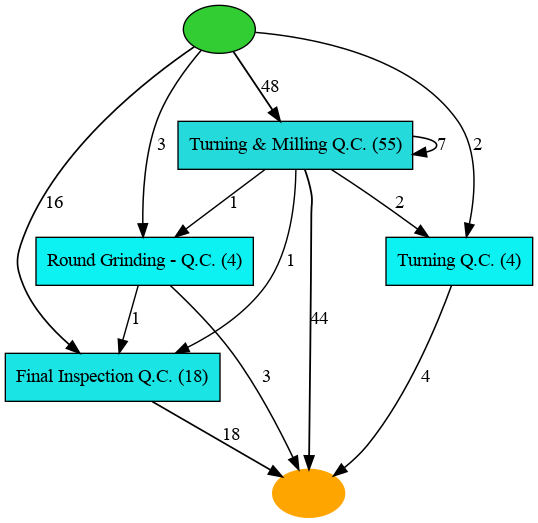

In [16]:

df_pm4py = pm4py.format_dataframe(df_rejection, case_id='Case ID', activity_key='Activity', timestamp_key='Start Timestamp')
log = pm4py.convert_to_event_log(df_pm4py)

petri = pm4py.discover_heuristics_net(log)
pm4py.view_heuristics_net(petri)


Não estar passando por inspeção já aparenta ser um problema interessante que pode ser mitigado.

# Hipótese 2

### Existem semelhanças entre as peças que causam defeitos?

<Axes: xlabel='Part Desc.'>

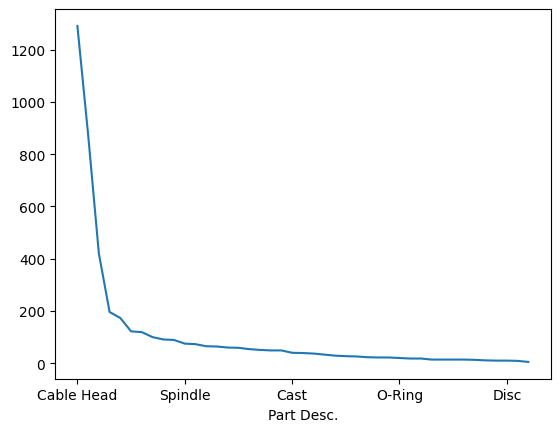

In [17]:

df['Part Desc.'].value_counts().plot()


Embora o valor pareça bem concentrado, são muitas classes para se realizar a análise individual.

Seria interessante realizar um clustering por `Part Desc.` e verificar se há uma relação com o nível de resíduos.

In [18]:
df['Part Desc.'].value_counts().describe()

count      43.000000
mean      105.651163
std       234.050756
min         5.000000
25%        18.000000
50%        39.000000
75%        74.000000
max      1291.000000
Name: count, dtype: float64

In [19]:
k = 8

X = df[['Part Desc.', 'Rejection']].copy()

values, names = pd.factorize(X['Part Desc.'])
X['Part Desc.'] = values

kmeans = KMeans(n_clusters=k, random_state=2002)
kmeans.fit(X)

y = kmeans.predict(X)

df_clustered = df.copy()
df_clustered['Cluster'] = y

With a mean rejection of 0.4071% (St. Dev. 0.0594). Consisted of 1711 rows.


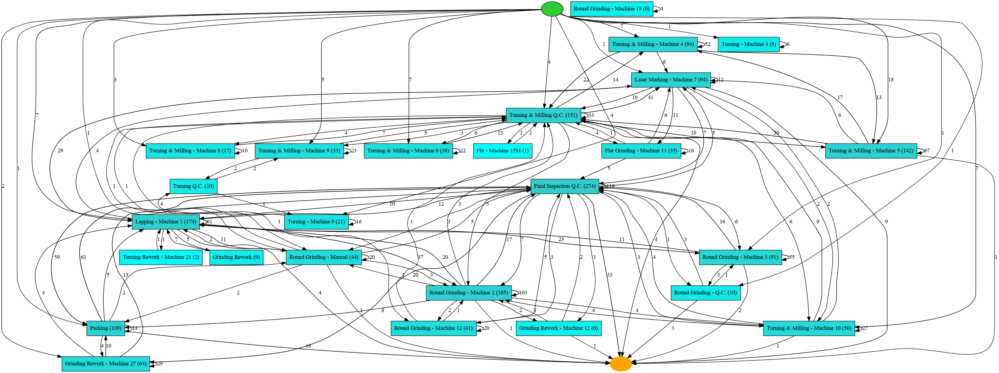

With a mean rejection of 0.0864% (St. Dev. 0.0069). Consisted of 195 rows.


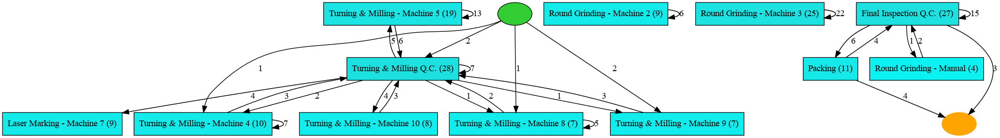

With a mean rejection of 0.0% (St. Dev. 0.0). Consisted of 219 rows.


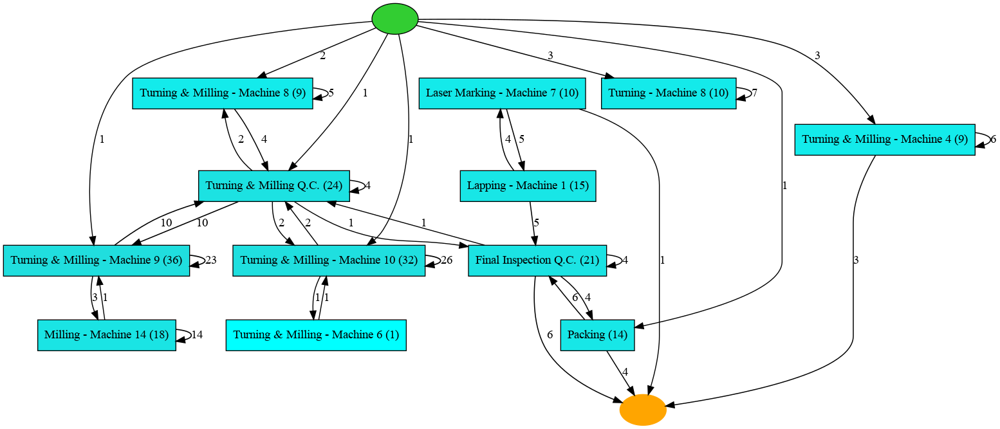

With a mean rejection of 0.1519% (St. Dev. 0.0129). Consisted of 305 rows.


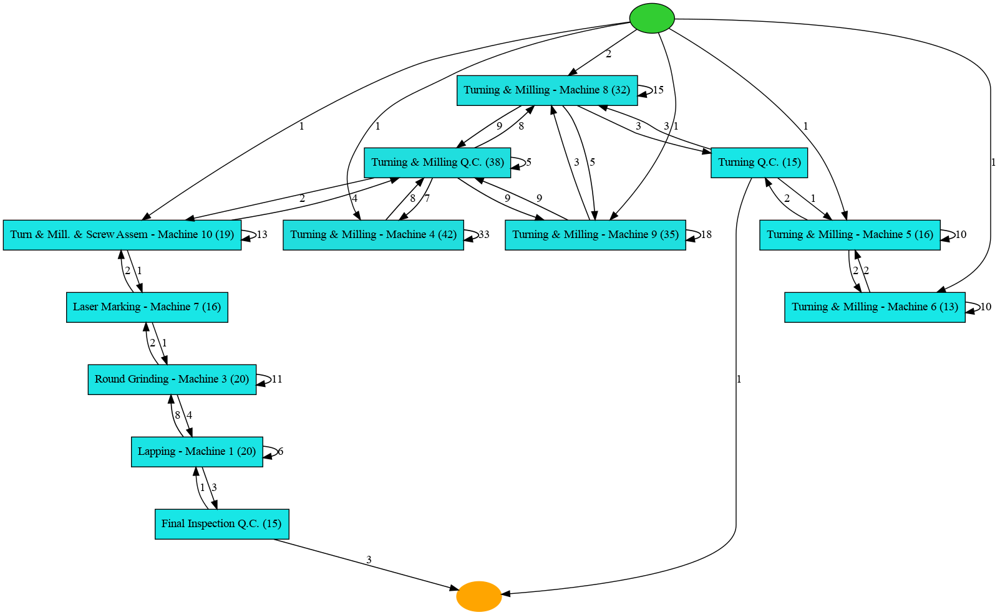

With a mean rejection of 0.3514% (St. Dev. 0.0609). Consisted of 1216 rows.


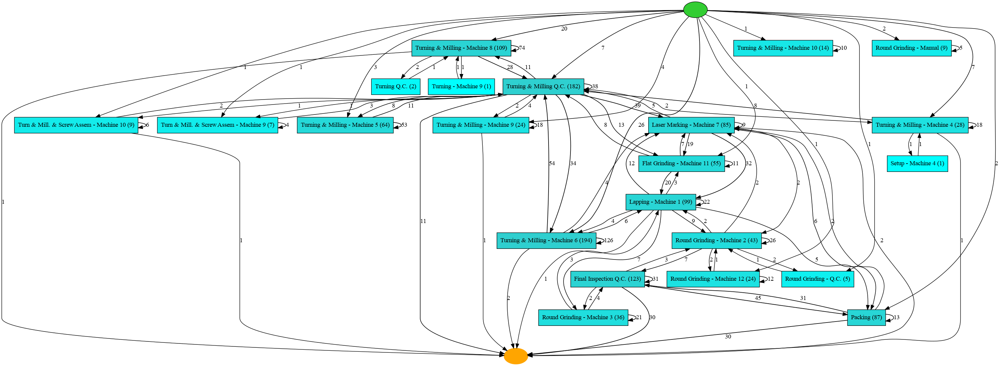

With a mean rejection of 0.2026% (St. Dev. 0.0274). Consisted of 351 rows.


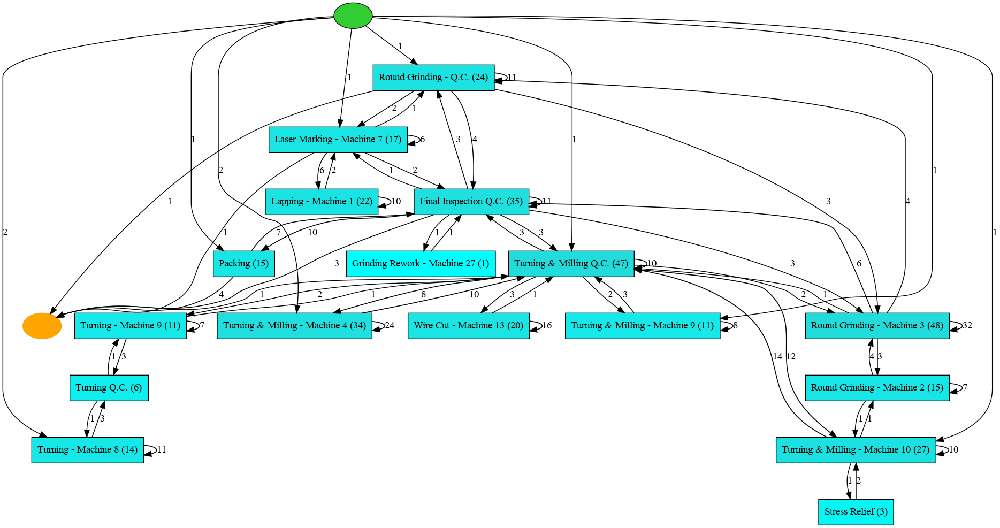

With a mean rejection of 0.0289% (St. Dev. 0.0026). Consisted of 242 rows.


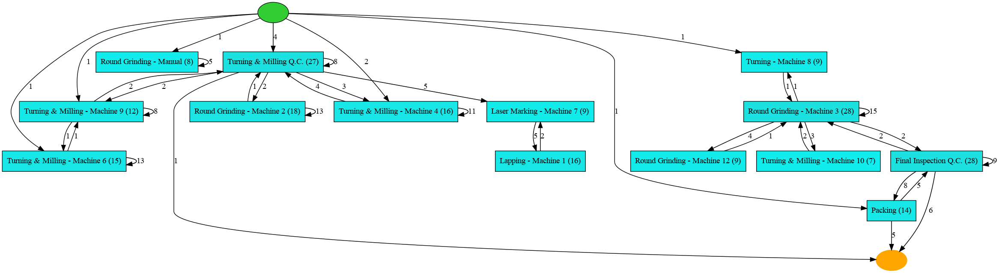

With a mean rejection of 0.4383% (St. Dev. 0.036). Consisted of 304 rows.


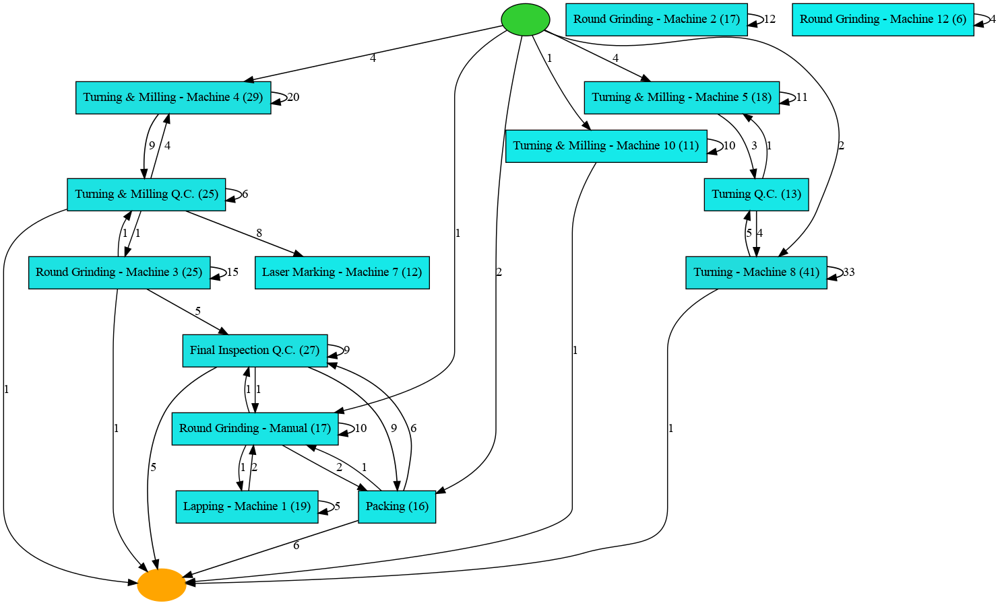

In [20]:

for i in range(k):

    df_cluster = df_clustered[df_clustered.Cluster == i].copy()
    df_pm4py = pm4py.format_dataframe(df_cluster, case_id='Case ID', activity_key='Activity', timestamp_key='Start Timestamp')
    log = pm4py.convert_to_event_log(df_pm4py)

    petri = pm4py.discover_heuristics_net(log, dependency_threshold=0.8, and_threshold=0.8)

    cluster_avg = round(df_cluster['Rejection'].mean() * 100, 4)
    cluster_std = round(df_cluster['Rejection'].std(), 4)

    print(f"With a mean rejection of {cluster_avg}% (St. Dev. {cluster_std}). Consisted of {df_cluster.shape[0]} rows.")
    pm4py.view_heuristics_net(petri)


Os desvios padrões demasiadamente altos indicam que há uma variação muito grande em todos os clusters, principalmente naqueles que possuem uma taxa de rejeição relativamente alta.

Isto pode indicar que a inclusão de mais dimensões para o KMeans pode reduzir a variância.

Por isso, incluindo, também, o WorkerID como variável na classificação.

In [27]:
k = 8

X = df[['Part Desc.', 'Rejection', 'Worker ID']].copy()

part_values, part_names = pd.factorize(X['Part Desc.'])
worker_values, worker_names = pd.factorize(X['Worker ID'])

X['Part Desc.'] = part_values
X['Worker ID'] = worker_values

kmeans = KMeans(n_clusters=k, random_state=2002)
kmeans.fit(X)

y = kmeans.predict(X)

df_clustered = df.copy()
df_clustered['Cluster'] = y

With a mean rejection of 0.7009% (St. Dev. 0.0882). Consisted of 1296 rows.


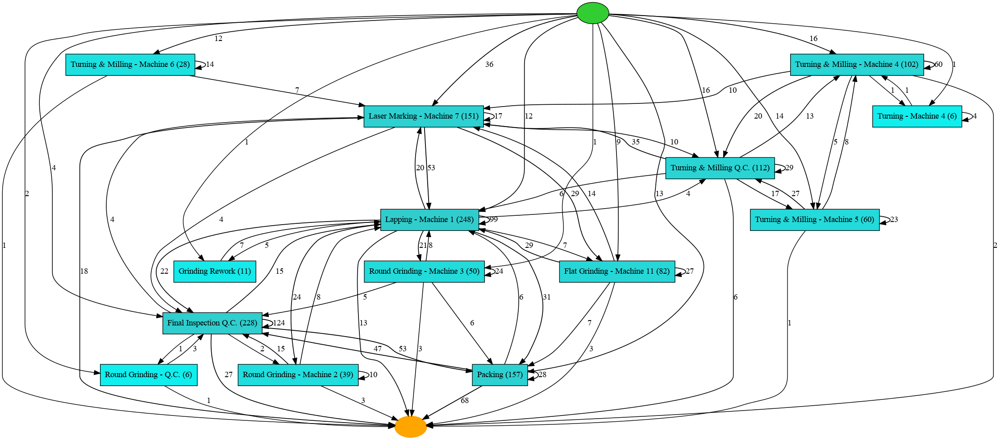

With a mean rejection of 0.0282% (St. Dev. 0.004). Consisted of 309 rows.


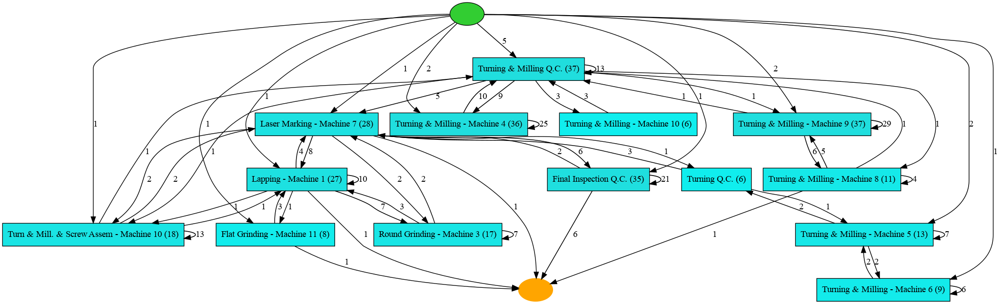

With a mean rejection of 0.2469% (St. Dev. 0.0302). Consisted of 288 rows.


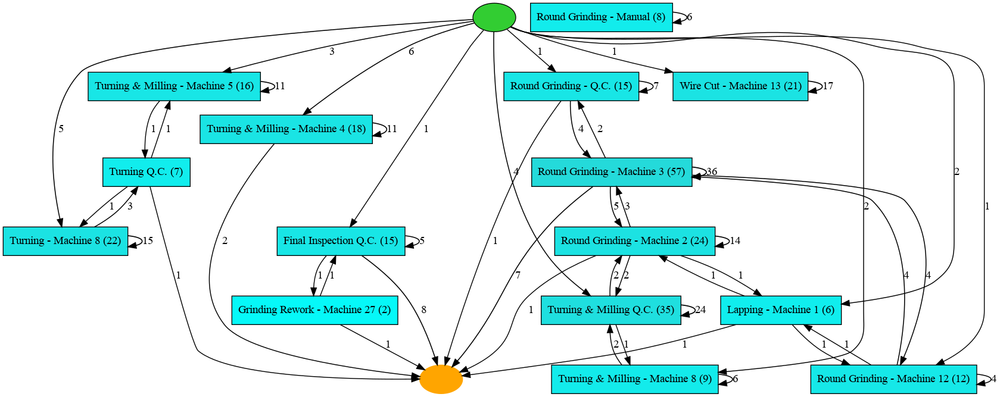

With a mean rejection of 0.2162% (St. Dev. 0.0147). Consisted of 252 rows.


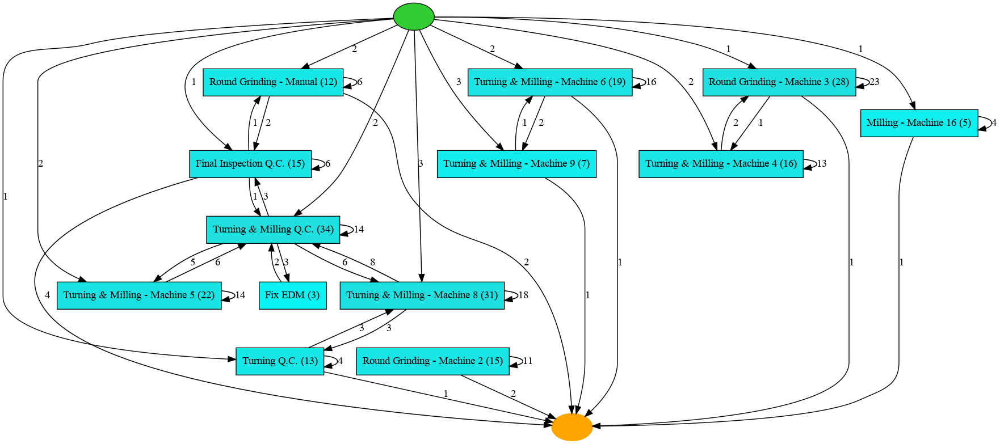

With a mean rejection of 0.1001% (St. Dev. 0.0095). Consisted of 938 rows.


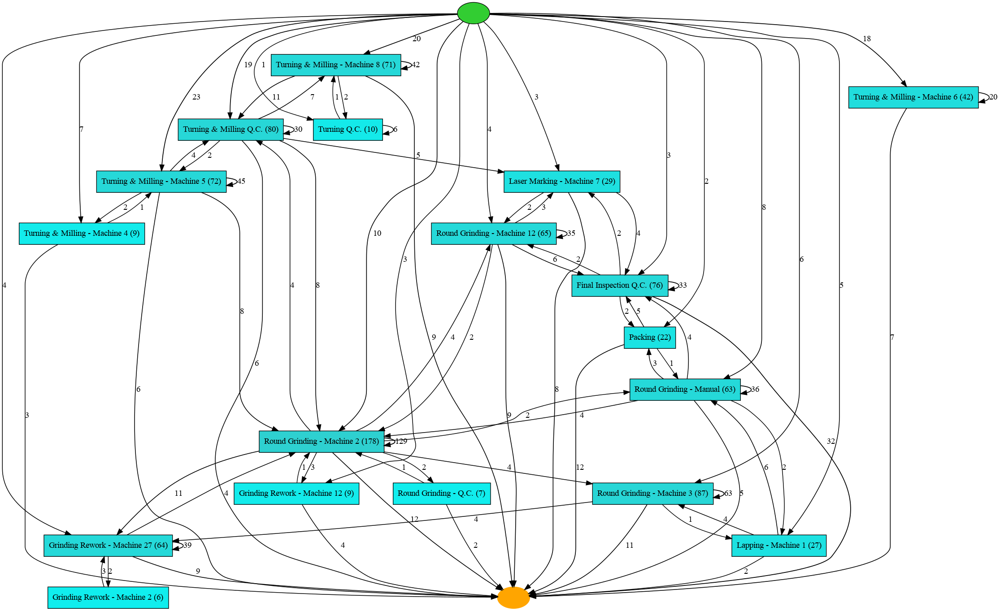

With a mean rejection of 0.1186% (St. Dev. 0.0155). Consisted of 551 rows.


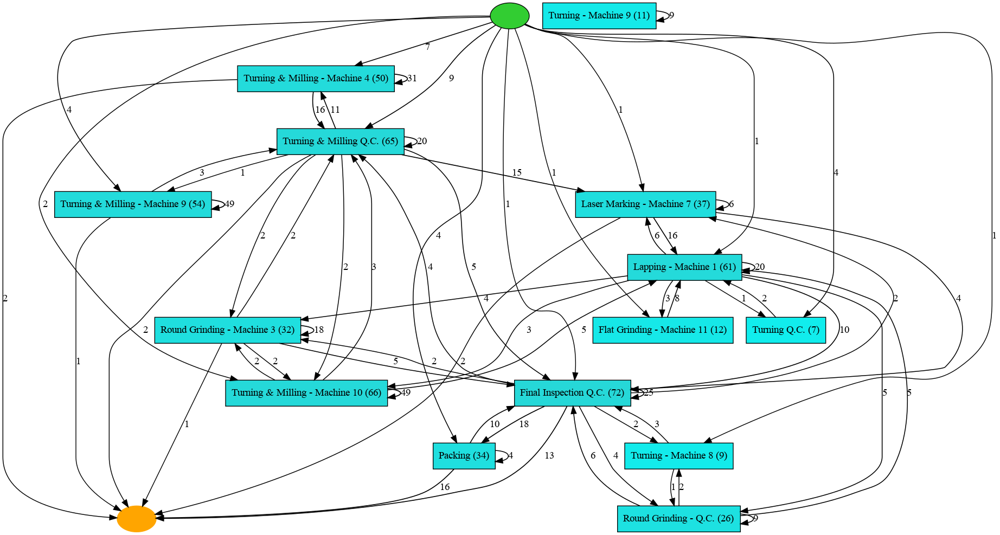

With a mean rejection of 0.0% (St. Dev. 0.0). Consisted of 75 rows.


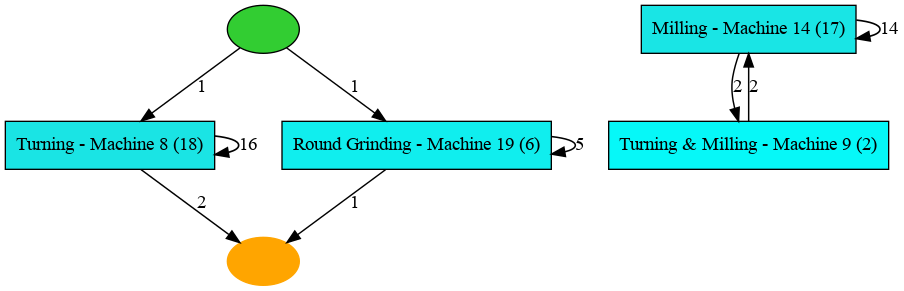

With a mean rejection of 0.2356% (St. Dev. 0.0269). Consisted of 834 rows.


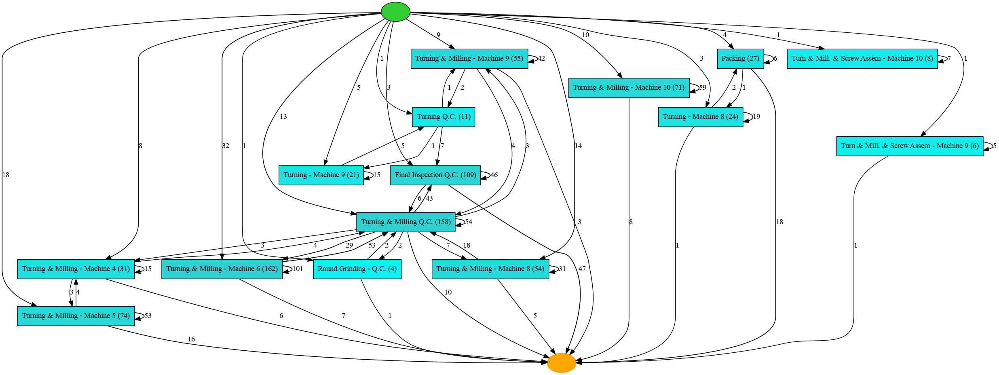

In [28]:

for i in range(k):

    df_cluster = df_clustered[df_clustered.Cluster == i].copy()
    df_pm4py = pm4py.format_dataframe(df_cluster, case_id='Case ID', activity_key='Activity', timestamp_key='Start Timestamp')
    log = pm4py.convert_to_event_log(df_pm4py)

    petri = pm4py.discover_heuristics_net(log, dependency_threshold=0.8, and_threshold=0.8, min_act_count=2)

    cluster_avg = round(df_cluster['Rejection'].mean() * 100, 4)
    cluster_std = round(df_cluster['Rejection'].std() , 4)

    print(f"With a mean rejection of {cluster_avg}% (St. Dev. {cluster_std}). Consisted of {df_cluster.shape[0]} rows.")
    pm4py.view_heuristics_net(petri)


A classificação parece boa, mas parece não fazer sentido utilizar o percentual de rejeição como uma variável para a categorização dos clusters, mas exclusivamente que se encontrem processos parecidos. Por isso, os seguintes eliminam esta variável do clustering.

In [25]:
k = 8

X = df[['Part Desc.', 'Worker ID']].copy()

part_values, part_names = pd.factorize(X['Part Desc.'])
worker_values, worker_names = pd.factorize(X['Worker ID'])

X['Part Desc.'] = part_values
X['Worker ID'] = worker_values

kmeans = KMeans(n_clusters=k, random_state=2002)
kmeans.fit(X)

y = kmeans.predict(X)

df_clustered = df.copy()
df_clustered['Cluster'] = y


With a mean rejection of 0.7009% (St. Dev. 0.0882). Consisted of 1296 rows.


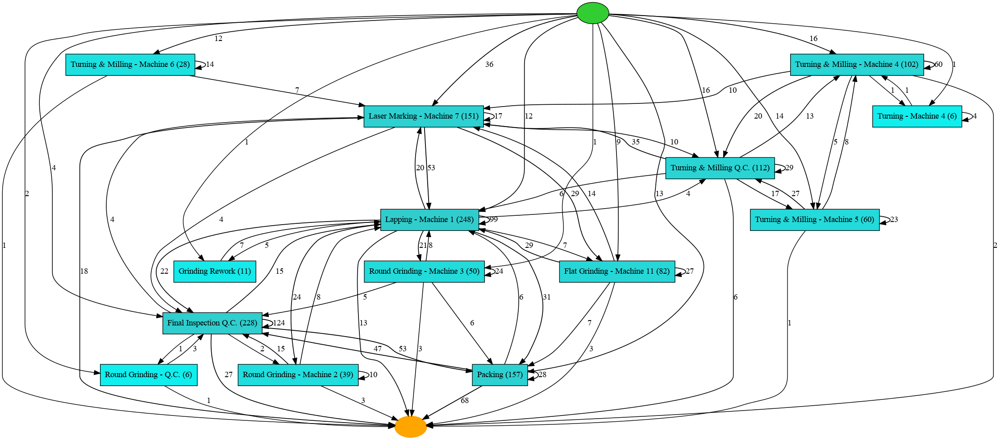

With a mean rejection of 0.0282% (St. Dev. 0.004). Consisted of 309 rows.


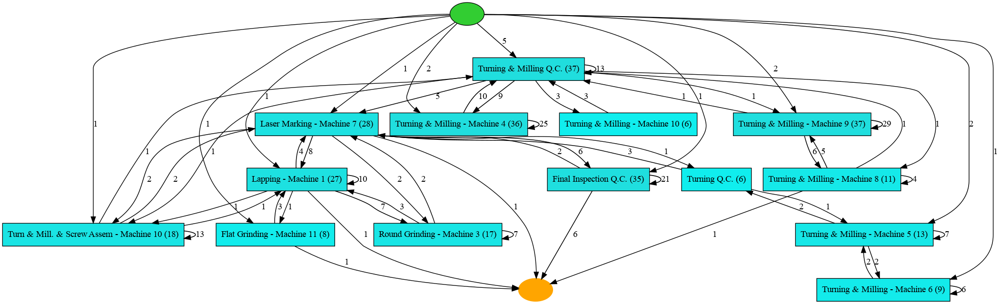

With a mean rejection of 0.2469% (St. Dev. 0.0302). Consisted of 288 rows.


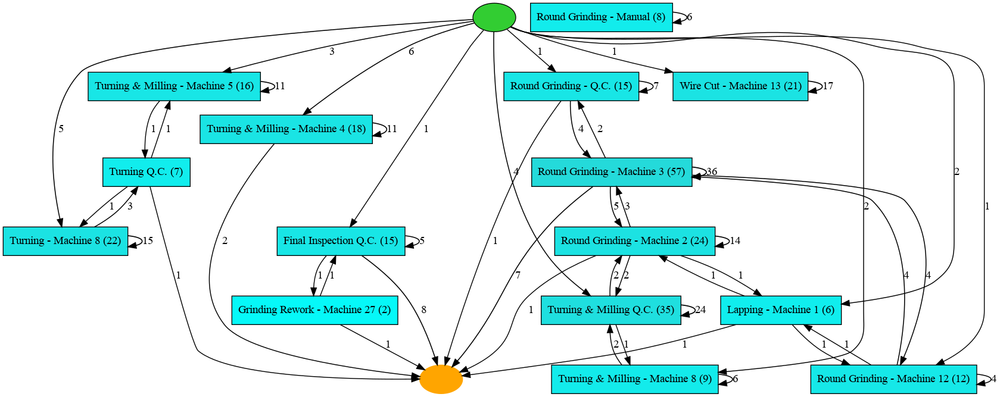

With a mean rejection of 0.2162% (St. Dev. 0.0147). Consisted of 252 rows.


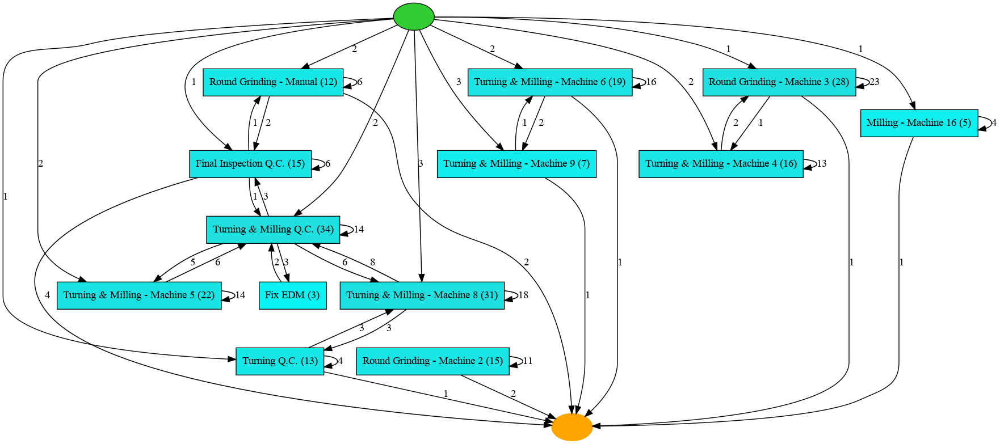

With a mean rejection of 0.1001% (St. Dev. 0.0095). Consisted of 938 rows.


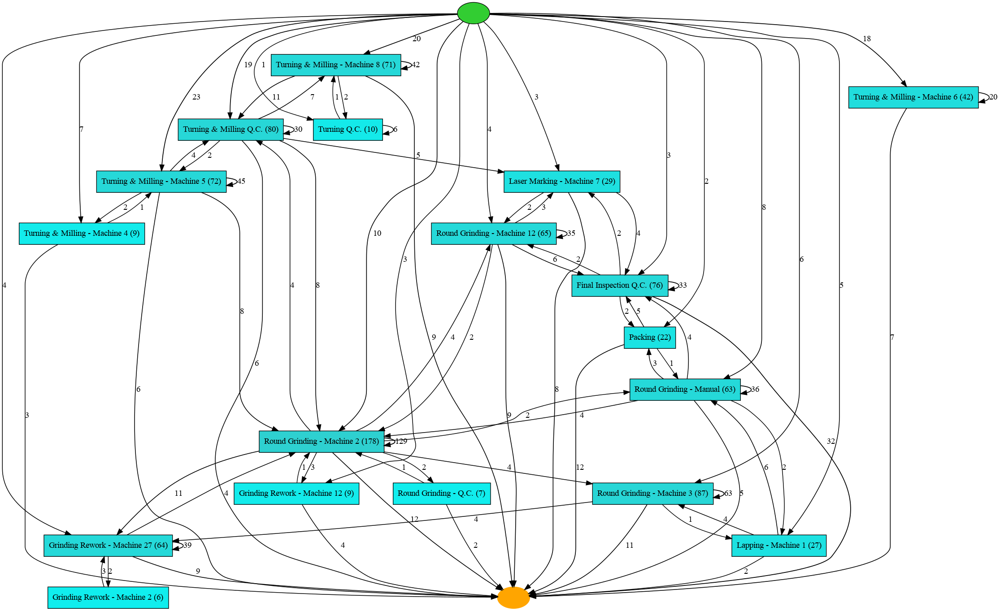

With a mean rejection of 0.1186% (St. Dev. 0.0155). Consisted of 551 rows.


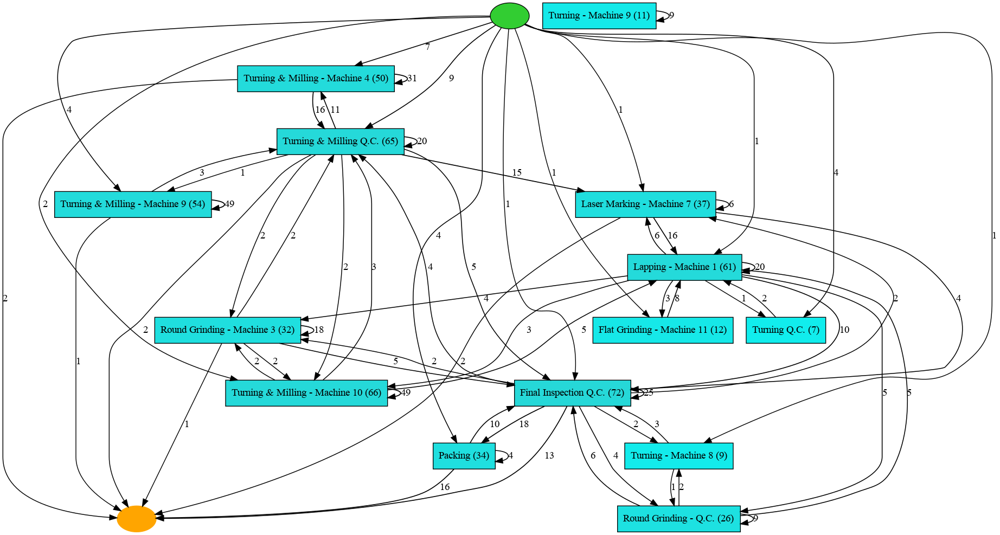

With a mean rejection of 0.0% (St. Dev. 0.0). Consisted of 75 rows.


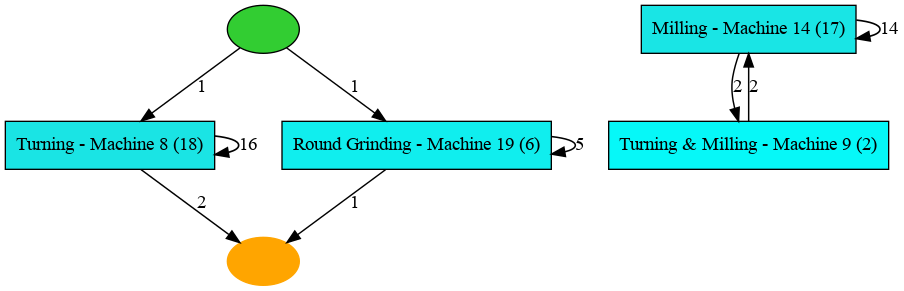

With a mean rejection of 0.2356% (St. Dev. 0.0269). Consisted of 834 rows.


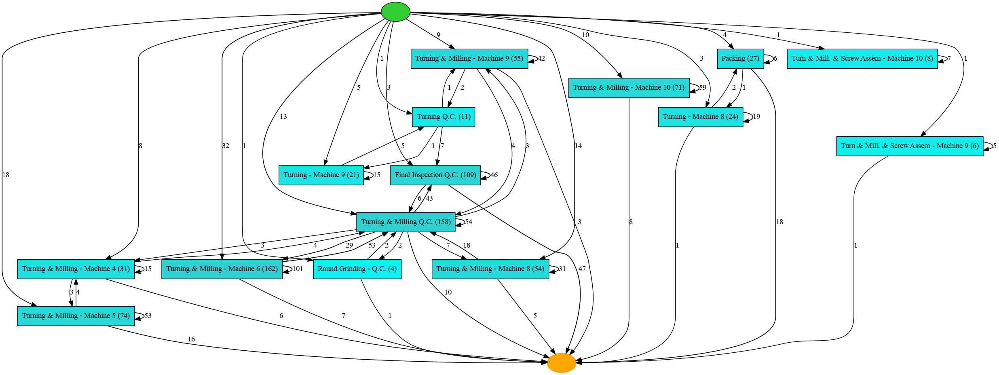

In [26]:

for i in range(k):

    df_cluster = df_clustered[df_clustered.Cluster == i].copy()
    df_pm4py = pm4py.format_dataframe(df_cluster, case_id='Case ID', activity_key='Activity', timestamp_key='Start Timestamp')
    log = pm4py.convert_to_event_log(df_pm4py)

    petri = pm4py.discover_heuristics_net(log, dependency_threshold=0.8, and_threshold=0.8, min_act_count=2)

    cluster_avg = round(df_cluster['Rejection'].mean() * 100, 4)
    cluster_std = round(df_cluster['Rejection'].std() , 4)

    print(f"With a mean rejection of {cluster_avg}% (St. Dev. {cluster_std}). Consisted of {df_cluster.shape[0]} rows.")
    pm4py.view_heuristics_net(petri)

O primeiro cluster possui 0,7% de rejeição. O que é muito significativo para o processo em contraste com os demais.

Assim, uma análise do que o compõe é essencial.

In [32]:
df_worst_process = df_clustered[df_clustered.Cluster == 0].copy()
df_worst_process.head()

,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Span,Work Order Qty,Part Desc.,Worker ID,Report Type,Qty Completed,Qty Rejected,Qty for MRB,Rework,Rejection,Cluster
0,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/29 23:24:00.000,2012/01/30 05:43:00.000,006:19,10,Cable Head,ID4932,S,1,0,0,NaN,0.000000,0
1,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 05:44:00.000,2012/01/30 06:42:00.000,000:58,10,Cable Head,ID4932,D,1,0,0,NaN,0.000000,0
2,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 06:59:00.000,2012/01/30 07:21:00.000,000:22,10,Cable Head,ID4167,S,0,0,0,NaN,0.000000,0
3,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 07:21:00.000,2012/01/30 10:58:00.000,003:37,10,Cable Head,ID4167,D,8,0,0,NaN,0.000000,0
4,Case 1,Turning & Milling Q.C.,Quality Check 1,2012/01/31 13:20:00.000,2012/01/31 14:50:00.000,001:30,10,Cable Head,ID4163,D,9,1,0,NaN,0.111111,0


<Axes: xlabel='Part Desc.'>

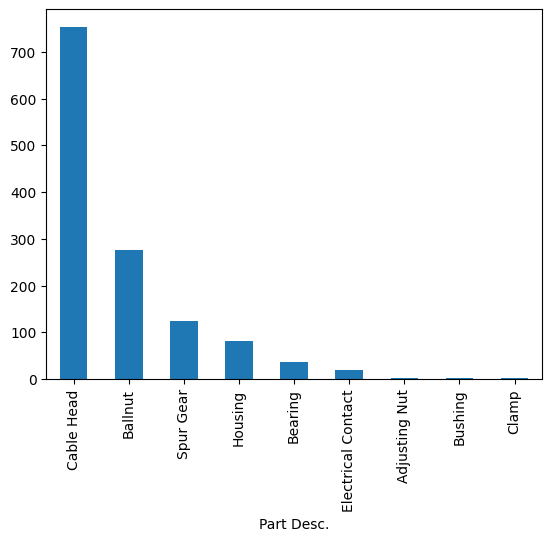

In [34]:
df_worst_process['Part Desc.'].value_counts().plot(kind='bar')

In [42]:
df_worst_process.groupby('Part Desc.').mean('Rejection')['Rejection'].sort_values(ascending=False)

Part Desc.
Housing               0.028240
Cable Head            0.008442
Ballnut               0.001593
Adjusting Nut         0.000000
Bearing               0.000000
Bushing               0.000000
Clamp                 0.000000
Electrical Contact    0.000000
Spur Gear             0.000000
Name: Rejection, dtype: float64

In [41]:
df_worst_process.groupby('Worker ID').mean('Rejection')['Rejection'].sort_values(ascending=False)

Worker ID
ID4493    0.063547
ID4163    0.003420
ID4167    0.000000
ID0998    0.000000
ID4445    0.000000
ID4820    0.000000
ID4882    0.000000
ID4932    0.000000
Name: Rejection, dtype: float64

In [48]:
df_worst_process.groupby(['Worker ID', 'Part Desc.']).mean('Rejection')['Rejection'].sort_values(ascending=False)[:20, ]

Worker ID  Part Desc.        
ID4493     Housing               0.114372
           Cable Head            0.056542
           Ballnut               0.048841
ID4163     Cable Head            0.003483
ID0998     Bearing               0.000000
           Electrical Contact    0.000000
           Cable Head            0.000000
           Housing               0.000000
           Bushing               0.000000
           Ballnut               0.000000
           Adjusting Nut         0.000000
ID4163     Clamp                 0.000000
           Ballnut               0.000000
ID0998     Spur Gear             0.000000
ID4163     Housing               0.000000
ID4167     Electrical Contact    0.000000
           Housing               0.000000
           Bearing               0.000000
           Ballnut               0.000000
ID4445     Ballnut               0.000000
Name: Rejection, dtype: float64

Aparentemente o colaborador ID4493 possui a maior quantidade de rejeições no cluster. 

Isto é, comparado com outros colaboradores quando realizam um trabalho parecido, ele possui a pior performance (considerando baixa rejeição como medida) ou maior atenção aos detalhes (considerando que o colaborador voluntariamente realize o descarte.).

# Hipótese 03

### Existe um erro principal no fluxo de trabalho do colaborador ID4493?

In [52]:

df_worker = df[df['Worker ID'] == 'ID4493'].copy()
df_worker.info()
df_worker.head()


<class 'pandas.core.frame.DataFrame'>
Index: 167 entries, 12 to 4154
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Case ID             167 non-null    object 
 1   Activity            167 non-null    object 
 2   Resource            167 non-null    object 
 3   Start Timestamp     167 non-null    object 
 4   Complete Timestamp  167 non-null    object 
 5   Span                167 non-null    object 
 6   Work Order  Qty     167 non-null    int64  
 7   Part Desc.          167 non-null    object 
 8   Worker ID           167 non-null    object 
 9   Report Type         167 non-null    object 
 10  Qty Completed       167 non-null    int64  
 11  Qty Rejected        167 non-null    int64  
 12  Qty for MRB         167 non-null    int64  
 13  Rework              2 non-null      object 
 14  Rejection           167 non-null    float64
dtypes: float64(1), int64(4), object(10)
memory usage: 20.9+ KB


,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Span,Work Order Qty,Part Desc.,Worker ID,Report Type,Qty Completed,Qty Rejected,Qty for MRB,Rework,Rejection
12,Case 1,Final Inspection Q.C.,Quality Check 1,2012/02/16 06:59:00.000,2012/02/16 07:59:00.000,001:00,10,Cable Head,ID4493,D,0,0,0,NaN,0.0
13,Case 1,Final Inspection Q.C.,Quality Check 1,2012/02/16 12:11:00.000,2012/02/16 16:12:00.000,004:01,10,Cable Head,ID4493,D,0,0,0,NaN,0.0
14,Case 1,Final Inspection Q.C.,Quality Check 1,2012/02/16 12:43:00.000,2012/02/16 13:58:00.000,000:00,10,Cable Head,ID4493,D,9,0,0,NaN,0.0
123,Case 104,Turning & Milling Q.C.,Quality Check 1,2012/03/20 09:54:00.000,2012/03/20 11:54:00.000,002:00,33,Cable Head,ID4493,D,0,0,0,NaN,0.0
124,Case 104,Turning & Milling Q.C.,Quality Check 1,2012/03/21 06:55:00.000,2012/03/21 07:41:00.000,000:46,33,Cable Head,ID4493,D,33,0,0,NaN,0.0


In [63]:

df_worker_rejection = df_worker[df_worker['Rejection'] > 0].copy()
df_worker_no_rejection = df_worker[df_worker['Rejection'] == 0].copy()


With rejections


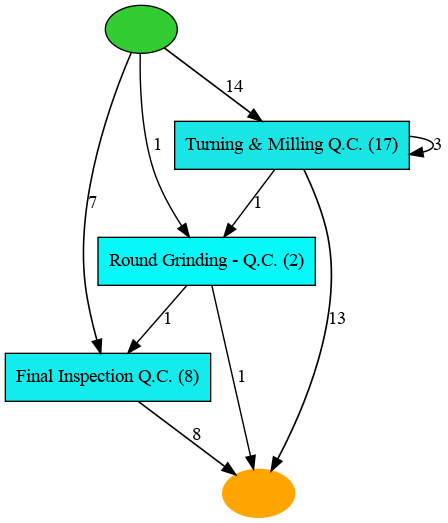

Without rejections


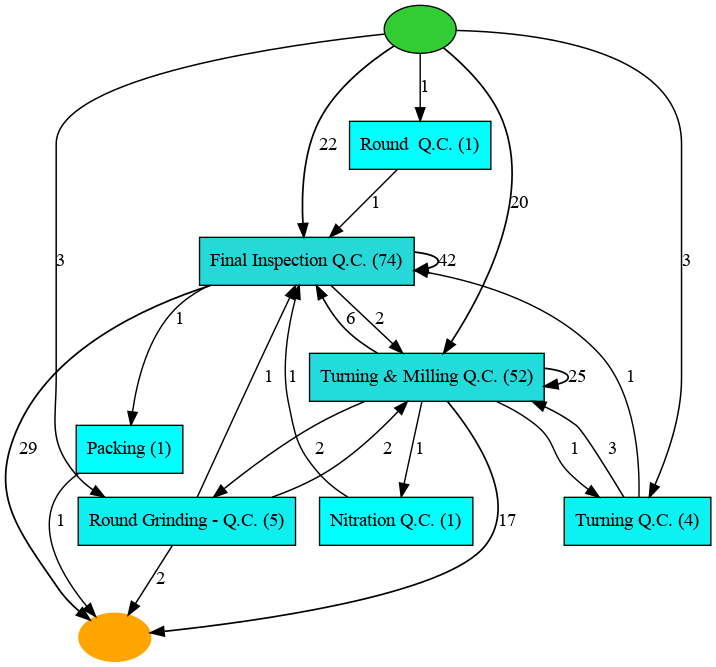

In [72]:

logs = {'With': df_worker_rejection, 'Without': df_worker_no_rejection}

for name, _df in logs.items():
        
    df_pm4py = pm4py.format_dataframe(_df, case_id='Case ID', activity_key='Activity', timestamp_key='Start Timestamp')
    log = pm4py.convert_to_event_log(df_pm4py)

    petri = pm4py.discover_heuristics_net(log, dependency_threshold=0.5, and_threshold=0.5, min_act_count=1)

    print(f'{name} rejections')
    pm4py.view_heuristics_net(petri)


Principais diferenças:

- Não há recursão na inspeção final;
- Casos que não passam por inspeção final (pode indicar sorte que alguns não sejam rejeitados);

Provavelmente o colaborador não está enviando ou realizando a inspeção final de muitas peças, o que pode causar uma maior incidência de rejeitos.

Deve-se avaliar se o colaborador possui a maior incidência de rejeições:

In [74]:
df.groupby('Worker ID').mean('Rejection')['Rejection'].sort_values(ascending=False)[:10, ]

Worker ID
ID4493    0.056335
ID4287    0.007218
ID4618    0.003643
ID4163    0.002704
ID3641    0.000000
ID0937    0.000000
ID0997    0.000000
ID0998    0.000000
ID3846    0.000000
ID3854    0.000000
Name: Rejection, dtype: float64

Em termos absolutos:

In [89]:
summary = df.groupby('Worker ID').sum()[['Qty Rejected', 'Qty Completed']]
summary['Rejection'] = np.where(summary['Qty Completed'] > 0, summary['Qty Rejected'] / summary['Qty Completed'], 0)
summary.sort_values(by='Rejection', ascending=False).head(10)

,Qty Rejected,Qty Completed,Rejection
Worker ID,,,
ID0937,34,671,0.050671
ID4163,144,2869,0.050192
ID4287,104,5646,0.018420
ID4493,85,4646,0.018295
ID4618,218,15362,0.014191
ID0998,5,13689,0.000365
ID0420,0,2603,0.000000
ID0997,0,1096,0.000000
ID3641,0,0,0.000000


In [92]:
df[df['Worker ID'] == 'ID0420']['Activity'].value_counts()

Activity
Round Grinding - Machine 3    49
Round Grinding - Machine 2    31
Lapping - Machine 1            6
Turning & Milling Q.C.         4
Flat Grinding - Machine 11     2
Laser Marking - Machine 7      1
Name: count, dtype: int64

In [100]:
df[df['Activity'].str.contains('Inspection') == True]['Worker ID'].value_counts()

Worker ID
ID4163    192
ID4618    170
ID4287    105
ID4493     83
ID0937      1
Name: count, dtype: int64

É possível verificar que todos os trabalhadores que possuem rejeições são os únicos que realizam inspeções.

In [104]:
df[df['Activity'].str.contains('Inspection') == True][['Resource']].value_counts()

Resource       
Quality Check 1    551
Name: count, dtype: int64

A indicação de que todos os defeitos apenas vêm dos testes de qualidade, leva a hipótese de que peças que não passam pelo controle de qualidade podem resultar em um problema que chega ao cliente final.

# Hipótese 4

### Existem oportunidades de atuação para o controle de qualidade?

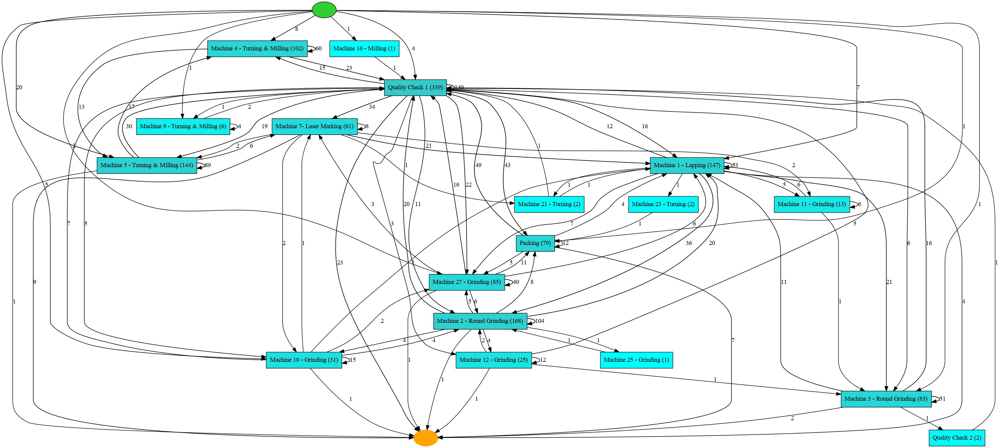

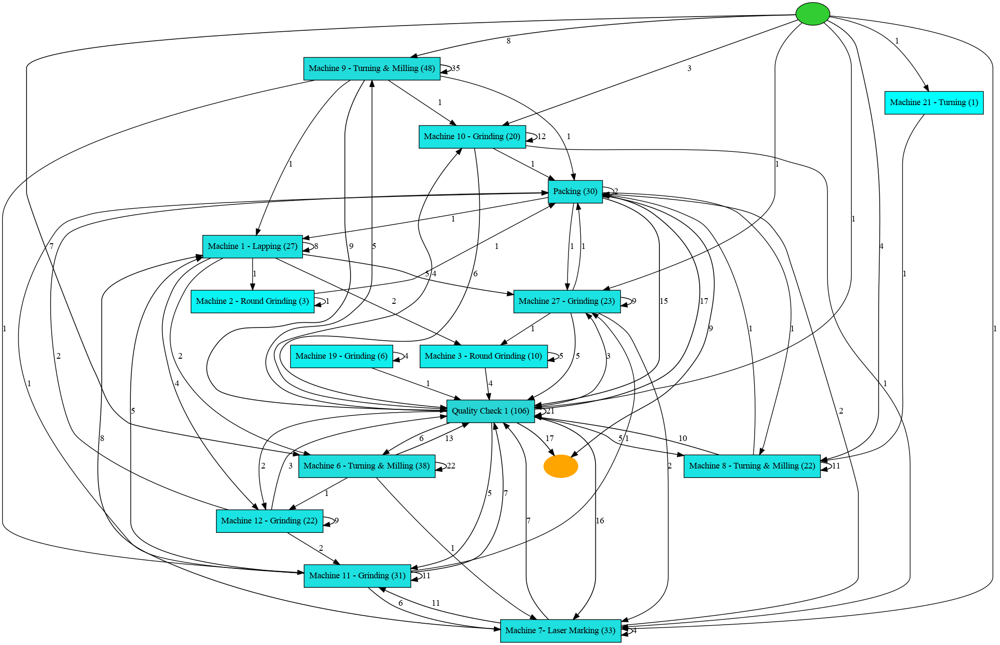

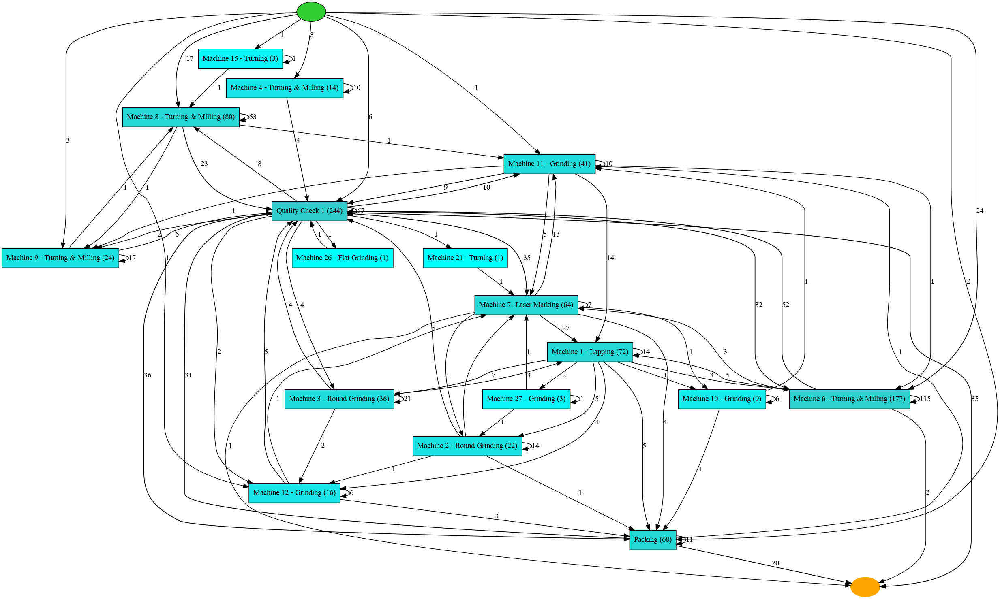

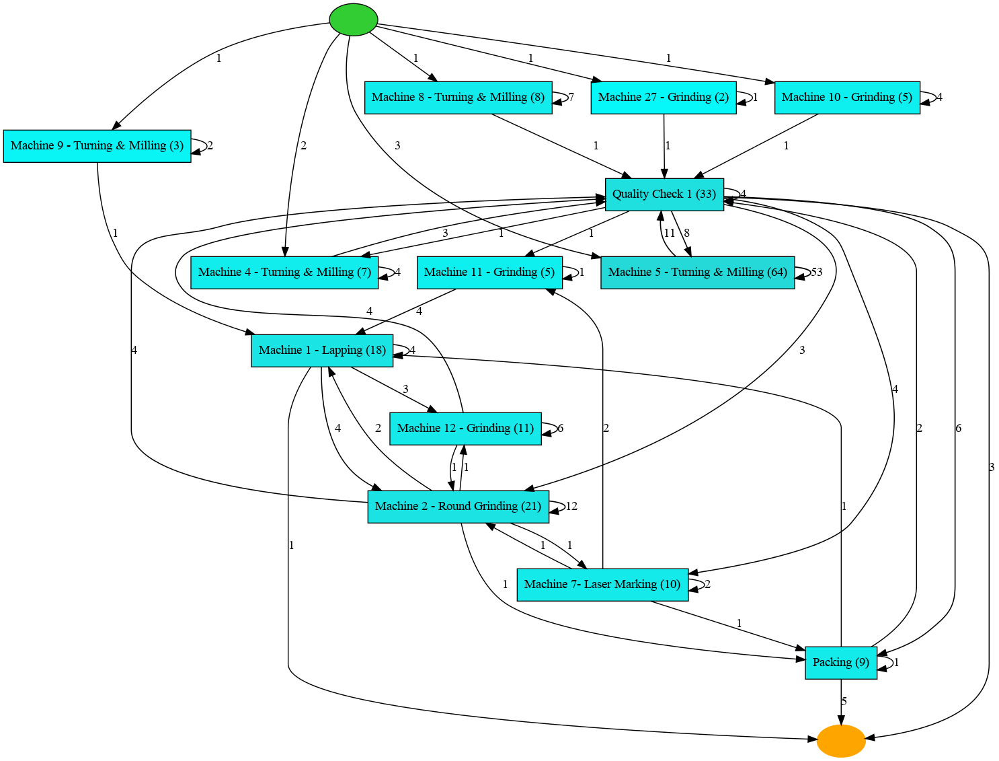

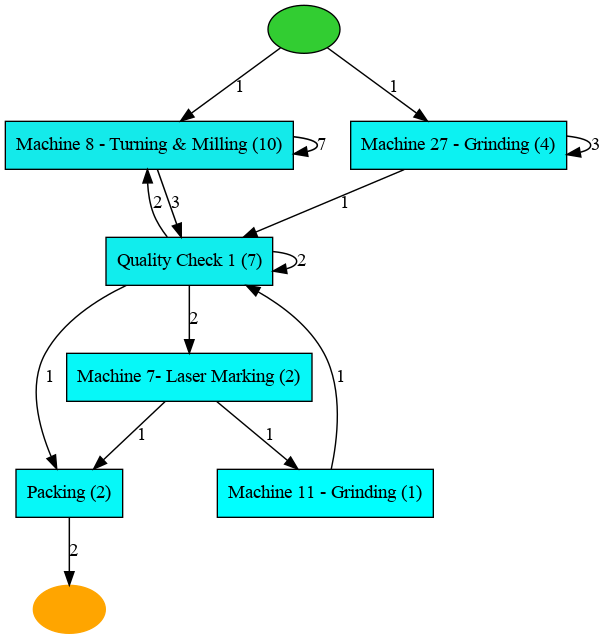

...

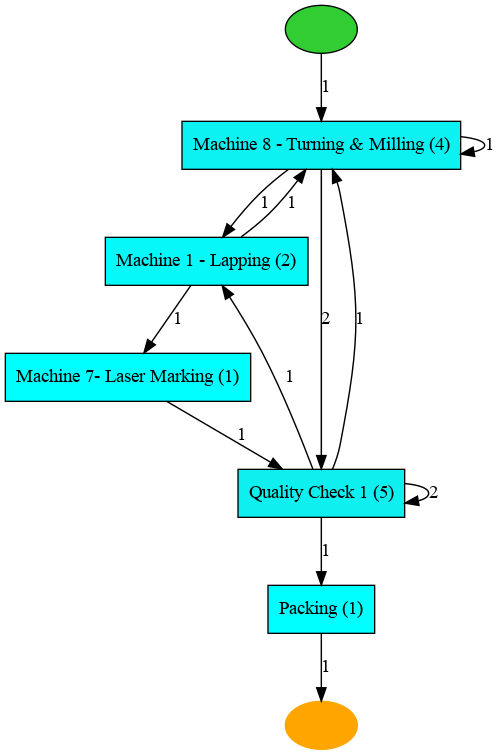

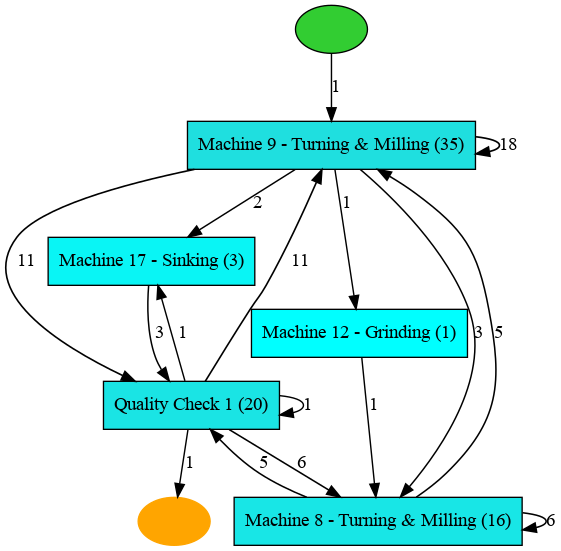

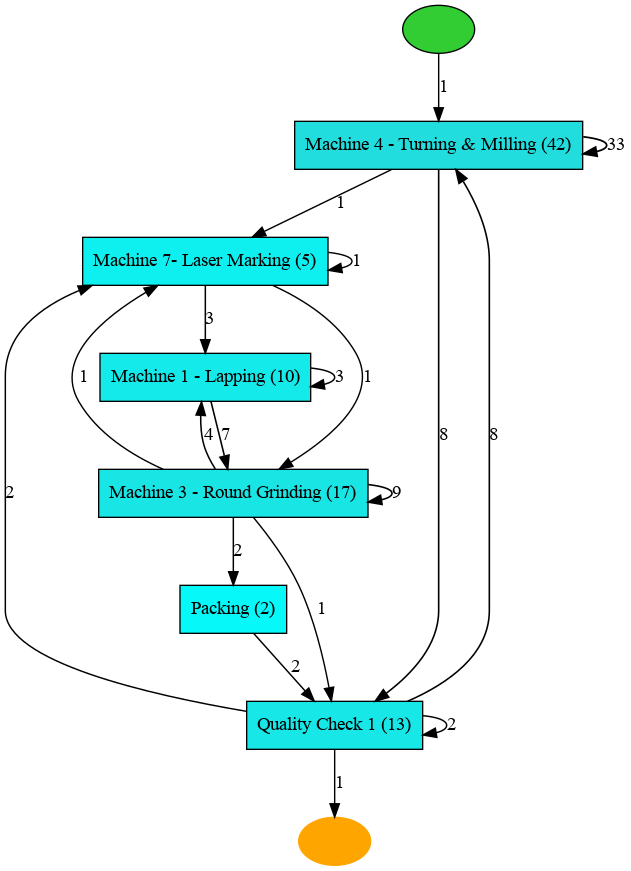

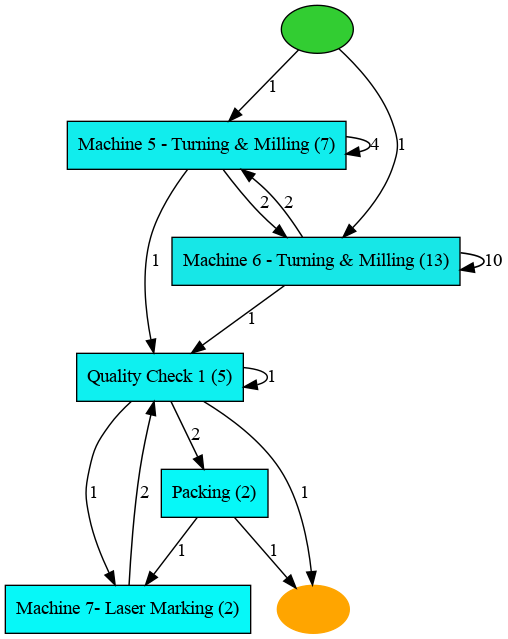

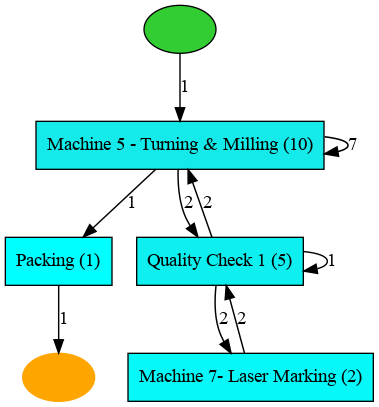

In [105]:

parts = list(df['Part Desc.'].unique())


for part in parts:

    df_part = df[df['Part Desc.'] == part].copy()

    df_pm4py = pm4py.format_dataframe(df_part, case_id='Case ID', activity_key='Resource', timestamp_key='Start Timestamp')
    log = pm4py.convert_to_event_log(df_pm4py)

    petri = pm4py.discover_heuristics_net(log, dependency_threshold=0.5, and_threshold=0.5, min_act_count=1)
    pm4py.view_heuristics_net(petri)


# Agrupar Clusters como o Rubens comentou...